<a href="https://www.kaggle.com/code/zeiadhany/image-captioning-ml-project?scriptVersionId=222000341" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/flickr8k/captions.txt
/kaggle/input/flickr8k/Images/3226254560_2f8ac147ea.jpg
/kaggle/input/flickr8k/Images/214543992_ce6c0d9f9b.jpg
/kaggle/input/flickr8k/Images/2366643786_9c9a830db8.jpg
/kaggle/input/flickr8k/Images/3368819708_0bfa0808f8.jpg
/kaggle/input/flickr8k/Images/2190227737_6e0bde2623.jpg
/kaggle/input/flickr8k/Images/2752809449_632cd991b3.jpg
/kaggle/input/flickr8k/Images/3097776588_312932e438.jpg
/kaggle/input/flickr8k/Images/1206506157_c7956accd5.jpg
/kaggle/input/flickr8k/Images/1319634306_816f21677f.jpg
/kaggle/input/flickr8k/Images/2465218087_fca77998c6.jpg
/kaggle/input/flickr8k/Images/3351493005_6e5030f596.jpg
/kaggle/input/flickr8k/Images/2949337912_beba55698b.jpg
/kaggle/input/flickr8k/Images/534886684_a6c9f40fa1.jpg
/kaggle/input/flickr8k/Images/3543600125_223747ef4c.jpg
/kaggle/input/flickr8k/Images/2174206711_11cb712a8d.jpg
/kaggle/input/flickr8k/Images/280706862_14c30d734a.jpg
/kaggle/input/flickr8k/Images/2100735137_05c6079537.jpg
/kaggle/input/f

In [2]:
import tensorflow as tf
print(tf.__version__)


2.16.1


In [3]:
!pip list

/opt/conda/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


Package                                  Version            Editable project location
---------------------------------------- ------------------ -------------------------
absl-py                                  1.4.0
accelerate                               0.34.2
aiobotocore                              2.15.1
aiofiles                                 22.1.0
aiohttp                                  3.9.5
aioitertools                             0.12.0
aiosignal                                1.3.1
aiosqlite                                0.20.0
albucore                                 0.0.17
albumentations                           1.4.17
alembic                                  1.13.3
altair                                   5.4.1
annotated-types                          0.7.0
annoy                                    1.17.3
ansicolors                               1.1.8
anyio                                    4.4.0
apache-beam                              2.46.0
appdirs            

In [4]:
import warnings
import matplotlib.pyplot as plt
import seaborn as sns

In [5]:
import tensorflow as tf
from tqdm import tqdm
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.utils import Sequence
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D, Activation, Dropout, Flatten, Dense, Input, Layer
from tensorflow.keras.layers import Embedding, LSTM, add, Concatenate, Reshape, concatenate, Bidirectional
from tensorflow.keras.applications import VGG16, ResNet50, DenseNet201
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau

In [6]:
df = pd.read_csv('/kaggle/input/flickr8k/captions.txt')

In [7]:
df.head()

,image,caption
0,1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set o...
1,1000268201_693b08cb0e.jpg,A girl going into a wooden building .
2,1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .
3,1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playh...
4,1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a woo...


In [8]:
image_path = '/kaggle/input/flickr8k/Images'

In [9]:
def read_img(path):
    img = load_img(path ,color_mode='rgb', target_size=(299,299))
    img = img_to_array(img)
    img = img/255.0
    return img

In [10]:
from textwrap import wrap

def display_imgs(rand_df):
    rand_df = rand_df.reset_index(drop = True)
    plt.figure(figsize=(25,25))
    n = 0
    for x in range(12):
        n+=1
        plt.subplot(4,4,n)
        img = read_img(f"../input/flickr8k/Images/{rand_df.image[x]}")
        plt.imshow(img)
        plt.title("\n".join(wrap(rand_df.caption[x], 20)))
        plt.axis("off")

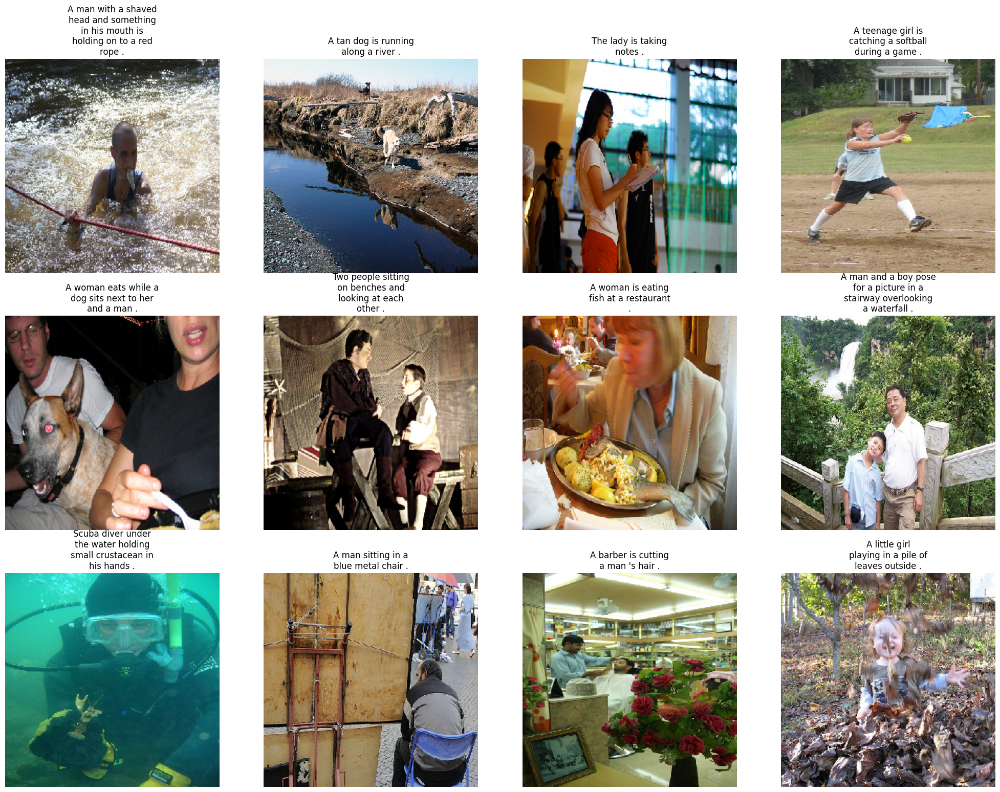

In [11]:
display_imgs(df.sample(15))

In [12]:
def text_preprocessing(df):
    df['caption'] = df['caption'].apply(lambda x: x.lower())
    df['caption'] = df['caption'].apply(lambda x: x.replace("[^A-Za-z]",""))
    df['caption'] = df['caption'].apply(lambda x: x.replace("\s+"," "))
    df['caption'] = df['caption'].apply(lambda x: " ".join([word for word in x.split() if len(word)>1]))
    df['caption'] = "sos "+df['caption']+" eos"
    return df

In [13]:
captions_before = df['caption'].tolist()
captions_before[:10]

['A child in a pink dress is climbing up a set of stairs in an entry way .',
 'A girl going into a wooden building .',
 'A little girl climbing into a wooden playhouse .',
 'A little girl climbing the stairs to her playhouse .',
 'A little girl in a pink dress going into a wooden cabin .',
 'A black dog and a spotted dog are fighting',
 'A black dog and a tri-colored dog playing with each other on the road .',
 'A black dog and a white dog with brown spots are staring at each other in the street .',
 'Two dogs of different breeds looking at each other on the road .',
 'Two dogs on pavement moving toward each other .']

In [14]:
df = text_preprocessing(df)

captions_after = df['caption'].tolist()
captions_after[:10]

['sos child in pink dress is climbing up set of stairs in an entry way eos',
 'sos girl going into wooden building eos',
 'sos little girl climbing into wooden playhouse eos',
 'sos little girl climbing the stairs to her playhouse eos',
 'sos little girl in pink dress going into wooden cabin eos',
 'sos black dog and spotted dog are fighting eos',
 'sos black dog and tri-colored dog playing with each other on the road eos',
 'sos black dog and white dog with brown spots are staring at each other in the street eos',
 'sos two dogs of different breeds looking at each other on the road eos',
 'sos two dogs on pavement moving toward each other eos']

In [15]:
tokenizer = Tokenizer()
tokenizer.fit_on_texts(captions_after)
vocab_size = len(tokenizer.word_index) + 1
max_length = max(len(caption.split()) for caption in captions_after)

In [16]:
import pickle

# Assuming 'tokenizer' is your trained tokenizer
with open("tokenizer.pkl", "wb") as f:
    pickle.dump(tokenizer, f)

print("Tokenizer saved successfully!")


Tokenizer saved successfully!


In [17]:
max_length

34

In [18]:
tokenizer.word_index

{'sos': 1,
 'eos': 2,
 'in': 3,
 'the': 4,
 'on': 5,
 'is': 6,
 'and': 7,
 'dog': 8,
 'with': 9,
 'man': 10,
 'of': 11,
 'two': 12,
 'white': 13,
 'black': 14,
 'boy': 15,
 'are': 16,
 'woman': 17,
 'girl': 18,
 'to': 19,
 'wearing': 20,
 'at': 21,
 'people': 22,
 'water': 23,
 'red': 24,
 'young': 25,
 'brown': 26,
 'an': 27,
 'his': 28,
 'blue': 29,
 'dogs': 30,
 'running': 31,
 'through': 32,
 'playing': 33,
 'while': 34,
 'shirt': 35,
 'down': 36,
 'standing': 37,
 'ball': 38,
 'little': 39,
 'grass': 40,
 'snow': 41,
 'child': 42,
 'person': 43,
 'jumping': 44,
 'over': 45,
 'three': 46,
 'front': 47,
 'sitting': 48,
 'holding': 49,
 'up': 50,
 'field': 51,
 'small': 52,
 'by': 53,
 'large': 54,
 'green': 55,
 'one': 56,
 'group': 57,
 'yellow': 58,
 'her': 59,
 'walking': 60,
 'children': 61,
 'men': 62,
 'into': 63,
 'air': 64,
 'beach': 65,
 'near': 66,
 'mouth': 67,
 'jumps': 68,
 'another': 69,
 'for': 70,
 'street': 71,
 'runs': 72,
 'its': 73,
 'from': 74,
 'riding': 75,
 '

In [19]:
print(max_length)
print(vocab_size)

34
8485


In [20]:
from sklearn.model_selection import train_test_split

images = df['image'].unique().tolist()
nimages = len(images)

train_images, val_images = train_test_split(images, test_size=0.15, random_state=42)


In [21]:
train = df[df['image'].apply(lambda img: img in train_images)]
test = df[df['image'].apply(lambda img: img in val_images)]


In [22]:
train.reset_index(inplace=True,drop=True)
test.reset_index(inplace=True,drop=True)

tokenizer.texts_to_sequences([captions_after[1]])[0]

[1, 18, 315, 63, 195, 116, 2]

In [23]:
captions_after[1]

'sos girl going into wooden building eos'

In [24]:
import os
import numpy as np
from tqdm import tqdm
from tensorflow.keras.applications.inception_v3 import InceptionV3, preprocess_input
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import Model


base_model = InceptionV3(weights="imagenet", include_top=False , pooling='avg')


feature_ext = base_model
img_size = 299
features = {}
image_paths = df['image'].unique().tolist()

for image_file in tqdm(image_paths):

    img_path = os.path.join(image_path, image_file)
    img = load_img(img_path, target_size=(img_size, img_size))
    img = img_to_array(img)
    img = np.expand_dims(img, axis=0)

    from tensorflow.keras.applications.inception_v3 import preprocess_input
    img = preprocess_input(img)


    feature = feature_ext.predict(img, verbose=0)
    features[image_file] = feature



87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


  0%|          | 0/8091 [00:00<?, ?it/s]WARNING: All log messages before absl::InitializeLog() is called are written to STDERR
I0000 00:00:1739287582.229917      78 service.cc:145] XLA service 0x7b3530002570 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1739287582.229972      78 service.cc:153]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1739287582.229976      78 service.cc:153]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1739287587.755531      78 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
100%|██████████| 8091/8091 [11:15<00:00, 11.97it/s]


In [25]:
features

{'1000268201_693b08cb0e.jpg': array([[0.12277611, 0.3329304 , 0.7527247 , ..., 0.21941453, 0.30208445,
         0.4027971 ]], dtype=float32),
 '1001773457_577c3a7d70.jpg': array([[0.7366833 , 0.59113264, 0.1819418 , ..., 0.16030231, 0.34144706,
         0.9083173 ]], dtype=float32),
 '1002674143_1b742ab4b8.jpg': array([[0.37349272, 0.24600595, 0.9633654 , ..., 1.1460391 , 0.2655143 ,
         0.01984648]], dtype=float32),
 '1003163366_44323f5815.jpg': array([[0.48604408, 0.2921791 , 0.31434792, ..., 0.9825374 , 0.28109562,
         0.22330523]], dtype=float32),
 '1007129816_e794419615.jpg': array([[0.21595934, 0.15582572, 0.29477635, ..., 0.40562904, 0.16532421,
         0.3741356 ]], dtype=float32),
 '1007320043_627395c3d8.jpg': array([[0.17230776, 0.4981062 , 0.21577151, ..., 0.09679485, 1.2298684 ,
         0.5421516 ]], dtype=float32),
 '1009434119_febe49276a.jpg': array([[0.53430736, 1.3675833 , 0.7805748 , ..., 0.39465564, 0.88758713,
         1.072793  ]], dtype=float32),
 '1012

In [26]:
feature_ext.save('feature_ext.h5')

In [27]:
max_length

34

In [28]:
import tensorflow as tf
from tensorflow.keras import layers, Model

def build_caption_model(vocab_size, max_length, embed_dim=256, units=512):

    features_input = layers.Input(shape=(2048,), name='image_features')

    feat_emb = layers.Dense(embed_dim, activation='relu')(features_input)
    

    caption_input = layers.Input(shape=(max_length-1,), name='caption_input')
    x = layers.Embedding(input_dim=vocab_size, output_dim=embed_dim, mask_zero=True)(caption_input)
    
    feat_emb_repeat = layers.RepeatVector(max_length-1)(feat_emb)
    x = layers.Concatenate(axis=-1)([x, feat_emb_repeat]) 
    
    x = layers.LSTM(units, return_sequences=True)(x)
    x = layers.TimeDistributed(layers.Dense(vocab_size, activation='softmax'))(x)
    
    model = Model(inputs=[features_input, caption_input], outputs=x)
    return model

model = build_caption_model(
    vocab_size=vocab_size,
    max_length=max_length
)

model.compile(
    loss="sparse_categorical_crossentropy",
    optimizer="adam"
)
model.summary()


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ image_features      │ (None, 2048)      │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ caption_input       │ (None, 33)        │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 256)       │    524,544 │ image_features[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding           │ (None, 33, 256)   │  2,172,160 │ caption_input[0]… │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector       │ (None, 33, 256)   │          0 │ dense[0][0]       │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_2       │ (None, 33, 512)   │          0 │ embedding[0][0],  │
│ (Concatenate)       │                   │            │ repeat_vector[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm (LSTM)         │ (None, 33, 512)   │  2,099,200 │ concatenate_2[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed    │ (None, 33, 8485)  │  4,352,805 │ lstm[0][0]        │
│ (TimeDistributed)   │                   │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 9,148,709 (34.90 MB)

 Trainable params: 9,148,709 (34.90 MB)

 Non-trainable params: 0 (0.00 B)

In [29]:
class CustomDataGenerator(Sequence):
    
    def __init__(
        self, df, X_col, y_col, batch_size, directory, tokenizer, 
        vocab_size, max_length, features, shuffle=True
    ):
        self.df = df.copy()
        self.X_col = X_col
        self.y_col = y_col
        self.directory = directory
        self.batch_size = batch_size
        self.tokenizer = tokenizer
        self.vocab_size = vocab_size
        self.max_length = max_length
        self.features = features
        self.shuffle = shuffle
        self.n = len(self.df)
        
    def on_epoch_end(self):
        if self.shuffle:
            self.df = self.df.sample(frac=1).reset_index(drop=True)
    
    def __len__(self):
        return self.n // self.batch_size
    
    def __getitem__(self, index):
        """
        Keras will call this to get a single batch of data: size == self.batch_size (captions).
        Each row in self.df is (image, caption).
        We produce arrays for that batch in (X1, X2, y).
        """
        batch = self.df.iloc[index * self.batch_size : (index + 1) * self.batch_size, :]
        X1, X2, y = self.__get_data(batch)        
        return (X1, X2), y
    
    def __get_data(self, batch):
        X1_list, X2_list, y_list = [], [], []
        

        for _, row in batch.iterrows():
            image_file = row[self.X_col]
            caption_str = row[self.y_col]
            

            feature = self.features[image_file][0]
            

            seq = self.tokenizer.texts_to_sequences([caption_str])[0]

            seq = pad_sequences([seq], maxlen=self.max_length, padding='post')[0]



            in_seq = seq[:-1] 
            out_seq = seq[1:] 



            X1_list.append(feature)  
            X2_list.append(in_seq)   
            y_list.append(out_seq)    

     
        X1_arr = np.array(X1_list, dtype="float32")                 
        X2_arr = np.array(X2_list, dtype="int32")                   
        y_arr  = np.array(y_list, dtype="float32")                  
        
        return X1_arr, X2_arr, y_arr


In [30]:
train_generator = CustomDataGenerator(df=train,X_col='image',y_col='caption',batch_size=16,directory=image_path,
                                      tokenizer=tokenizer,vocab_size=vocab_size,max_length=max_length,features=features)

validation_generator = CustomDataGenerator(df=test,X_col='image',y_col='caption',batch_size=16,directory=image_path,
                                      tokenizer=tokenizer,vocab_size=vocab_size,max_length=max_length,features=features)

In [31]:
model_name = "model.keras"
checkpoint = ModelCheckpoint(model_name,
                            monitor="val_loss",
                            mode="min",
                            save_best_only = True,
                            verbose=1)

earlystopping = EarlyStopping(monitor='val_loss',min_delta = 0, patience = 5, verbose = 1, restore_best_weights=True)

learning_rate_reduction = ReduceLROnPlateau(monitor='val_loss', 
                                            patience=3, 
                                            verbose=1, 
                                            factor=0.2, 
                                            min_lr=0.00000001)

In [32]:
history = model.fit(
        train_generator,
        epochs=50,
        validation_data=validation_generator,
        callbacks=[checkpoint,earlystopping,learning_rate_reduction])

Epoch 1/50


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2149/2149 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 1.8268
Epoch 1: val_loss improved from inf to 1.21730, saving model to model.keras
2149/2149 ━━━━━━━━━━━━━━━━━━━━ 81s 35ms/step - loss: 1.8267 - val_loss: 1.2173 - learning_rate: 0.0010
Epoch 2/50
2149/2149 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 1.1271
Epoch 2: val_loss improved from 1.21730 to 1.09221, saving model to model.keras
2149/2149 ━━━━━━━━━━━━━━━━━━━━ 76s 35ms/step - loss: 1.1271 - val_loss: 1.0922 - learning_rate: 0.0010
Epoch 3/50
2149/2149 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.9604
Epoch 3: val_loss improved from 1.09221 to 1.06093, saving model to model.keras
2149/2149 ━━━━━━━━━━━━━━━━━━━━ 76s 35ms/step - loss: 0.9604 - val_loss: 1.0609 - learning_rate: 0.0010
Epoch 4/50
2149/2149 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.8571
Epoch 4: val_loss improved from 1.06093 to 1.05739, saving model to model.keras
2149/2149 ━━━━━━━━━━━━━━━━━━━━ 76s 35ms/step - loss: 0.8571 - val_loss: 1.0574 - learning_rate: 0.0010
Epo

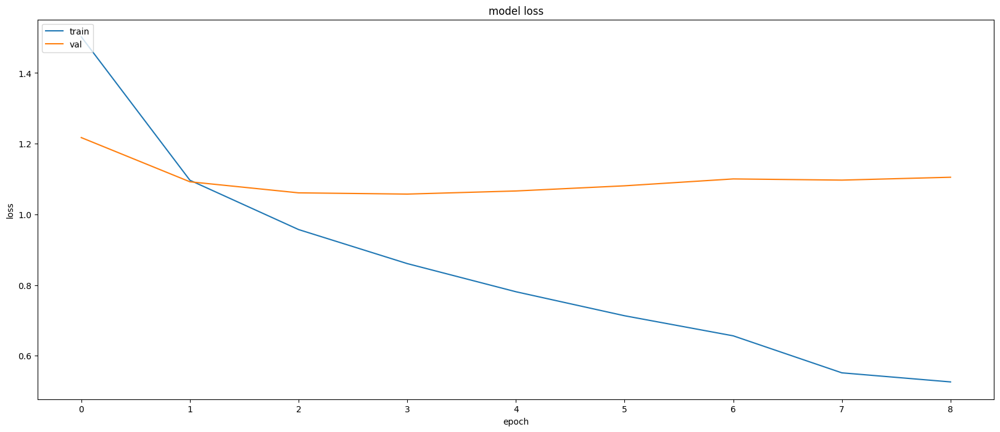

In [33]:
plt.figure(figsize=(20,8))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

In [34]:
def idx_to_word(integer,tokenizer):
    
    for word, index in tokenizer.word_index.items():
        if index==integer:
            return word
    return None

In [35]:
def predict_caption(model, image, tokenizer, max_length, features):
    
    feature = features[image]
    in_text = "sos"
    for i in range(max_length):
        sequence = tokenizer.texts_to_sequences([in_text])[0]
        sequence = pad_sequences([sequence], max_length)


        y_pred = model.predict([feature,sequence])
        y_pred = np.argmax(y_pred)
        
        word = idx_to_word(y_pred, tokenizer)
        
        if word is None:
            break
            
        in_text+= " " + word
        
        if word == 'eos':
            break
    print(f"[DEBUG] Sequence shape: {sequence.shape}, dtype: {sequence.dtype}")  # (1, 33), int32
    print(f"[DEBUG] Feature shape: {feature.shape}, dtype: {feature.dtype}")    
    return in_text 

In [36]:
in_text = "startseq"
sequence = tokenizer.texts_to_sequences([in_text])[0]
sequence = pad_sequences([sequence], max_length-1)
print(f"[DEBUG] Sequence shape: {sequence.shape}, dtype: {sequence.dtype}")  # (1, 33), int32
print(f"[DEBUG] Feature shape: {feature.shape}, dtype: {feature.dtype}") 


[DEBUG] Sequence shape: (1, 33), dtype: int32
[DEBUG] Feature shape: (1, 2048), dtype: float32


In [37]:
sample1 = test.sample(1)

In [38]:
samples = test.sample(15)
samples.reset_index(drop=True,inplace=True)

In [39]:
        print
        print(f"[DEBUG] Feature shape: {feature.shape}, dtype: {feature.dtype}")

[DEBUG] Feature shape: (1, 2048), dtype: float32


In [40]:
for index,record in samples.iterrows():

    img = load_img(os.path.join(image_path,record['image']),target_size=(299,299))
    img = img_to_array(img)    
    caption = predict_caption(model, record['image'], tokenizer, max_length-1, features)
    samples.loc[index,'caption'] = caption

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step
[DEBUG] Sequence shape: (1, 33), dtype: int32
[DEBUG] Feature shape: (1, 2048), dtype: float32
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
[DEBUG] Sequence shape: (1, 33), dtype: int32
[DEBUG] Feature shape: (1, 2048), dtype: float32
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
[DEBUG] Sequence shape: (1, 33), dtype: int32
[DEBUG] Feature shape: (1, 2048), dtype: float32
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
[DEBUG] Sequence shape: (1, 33), dtype: int32
[DEBUG] Feature shape: (1, 2048), dtype: float32
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
[DEBUG] Sequence shape: (1, 33), dtype: int32
[DEBUG] Feature shape: (1, 2048), dtype: float32
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
[DEBUG] Sequence shape: (1, 33), dtype: int32
[DEBUG] Feature shape: (1, 2048), dtype: float32
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
[DEBUG] Sequence shape: (1, 33), dtype: int32
[DEBUG] Feature shape: (1, 2048), dtype: float32
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
[DEBUG] Sequence shape: (1, 33

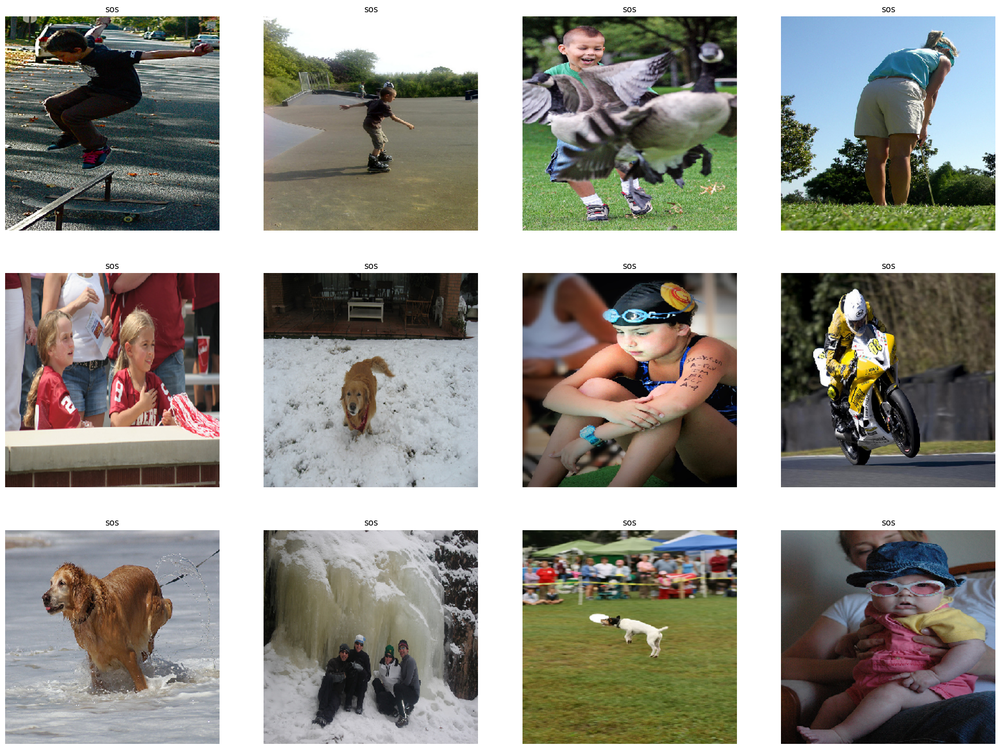

In [41]:
display_imgs(samples)


In [42]:
image = test.sample(1)

In [43]:
def extract_features_inception(img_path, feature_ext_model, target_size=(299,299)):
    from tensorflow.keras.preprocessing.image import load_img, img_to_array
    from tensorflow.keras.applications.inception_v3 import preprocess_input
    
    img = load_img(img_path, target_size=target_size)
    x = img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    feat = feature_ext_model.predict(x)
    return feat[0]  # shape (2048,)


In [44]:
import numpy as np
from tensorflow.keras.preprocessing.sequence import pad_sequences

def generate_caption(image_file, model, tokenizer, max_length, features, start_token='sos', end_token='eos'):



    feature_vec = features[image_file][0]
    start_id = tokenizer.word_index.get(start_token, None)
    end_id   = tokenizer.word_index.get(end_token, None)
    if start_id is None or end_id is None:
        raise ValueError("Your tokenizer must contain start/end tokens like 'sos'/'eos'.")

    partial_seq = [start_id]

    for _ in range(max_length - 1):
       
        seq_padded = pad_sequences([partial_seq], maxlen=max_length-1, padding='post')
        print(f"[DEBUG] Feature shape: {seq_padded.shape}, dtype: {seq_padded.dtype}")
        print(f"[DEBUG] Feature shape: {(np.expand_dims(feature_vec, axis=0)).shape}, dtype: {(np.expand_dims(feature_vec, axis=0)).dtype}")

        preds = model.predict(
            [np.expand_dims(feature_vec, axis=0), seq_padded], 
            verbose=0
        )


        next_token_logits = preds[0, len(partial_seq)-1]


        next_token_id = np.argmax(next_token_logits)


        partial_seq.append(next_token_id)


        if next_token_id == end_id:
            break


    caption_words = []
    for token_id in partial_seq:
        word = tokenizer.index_word.get(token_id, '')
        if word == end_token:
            break
        if word not in [start_token, end_token]:
            caption_words.append(word)

    final_caption = " ".join(caption_words)
    return final_caption


In [45]:
samples = test.sample(15)
samples.reset_index(drop=True,inplace=True)

In [46]:
samples

,image,caption
0,94232465_a135df2711.jpg,sos mother pulls her daughter in wagon over sn...
1,3416339125_0860d3d1eb.jpg,sos two men drinking beers at table eos
2,2695085448_a11833df95.jpg,sos woman on the phone next to brick wall eos
3,405537503_f66ecc5073.jpg,sos young man is climbing up rock face with on...
4,3182258223_5b9c8a8c55.jpg,sos girl stands reading notebook eos
5,3517127930_5dbddb45f6.jpg,sos boy hits the ball at baseball game eos
6,2648165716_02e2e74fd6.jpg,sos boy swings plastic bat eos
7,760138567_762d9022d4.jpg,sos girl goes down yellow slide into pool eos
8,2112921744_92bf706805.jpg,sos white dog is standing on grassy hillside eos
9,2045023435_181854c013.jpg,sos brown dog catches ball in sunny yard eos


In [47]:
for index,record in samples.iterrows():  
    caption = generate_caption(record['image'],model, tokenizer, max_length, features, start_token='sos', end_token='eos' )
    samples.loc[index,'caption'] = caption

[DEBUG] Feature shape: (1, 33), dtype: int32
[DEBUG] Feature shape: (1, 2048), dtype: float32
[DEBUG] Feature shape: (1, 33), dtype: int32
[DEBUG] Feature shape: (1, 2048), dtype: float32
[DEBUG] Feature shape: (1, 33), dtype: int32
[DEBUG] Feature shape: (1, 2048), dtype: float32
[DEBUG] Feature shape: (1, 33), dtype: int32
[DEBUG] Feature shape: (1, 2048), dtype: float32
[DEBUG] Feature shape: (1, 33), dtype: int32
[DEBUG] Feature shape: (1, 2048), dtype: float32
[DEBUG] Feature shape: (1, 33), dtype: int32
[DEBUG] Feature shape: (1, 2048), dtype: float32
[DEBUG] Feature shape: (1, 33), dtype: int32
[DEBUG] Feature shape: (1, 2048), dtype: float32
[DEBUG] Feature shape: (1, 33), dtype: int32
[DEBUG] Feature shape: (1, 2048), dtype: float32
[DEBUG] Feature shape: (1, 33), dtype: int32
[DEBUG] Feature shape: (1, 2048), dtype: float32
[DEBUG] Feature shape: (1, 33), dtype: int32
[DEBUG] Feature shape: (1, 2048), dtype: float32
[DEBUG] Feature shape: (1, 33), dtype: int32
[DEBUG] Feature

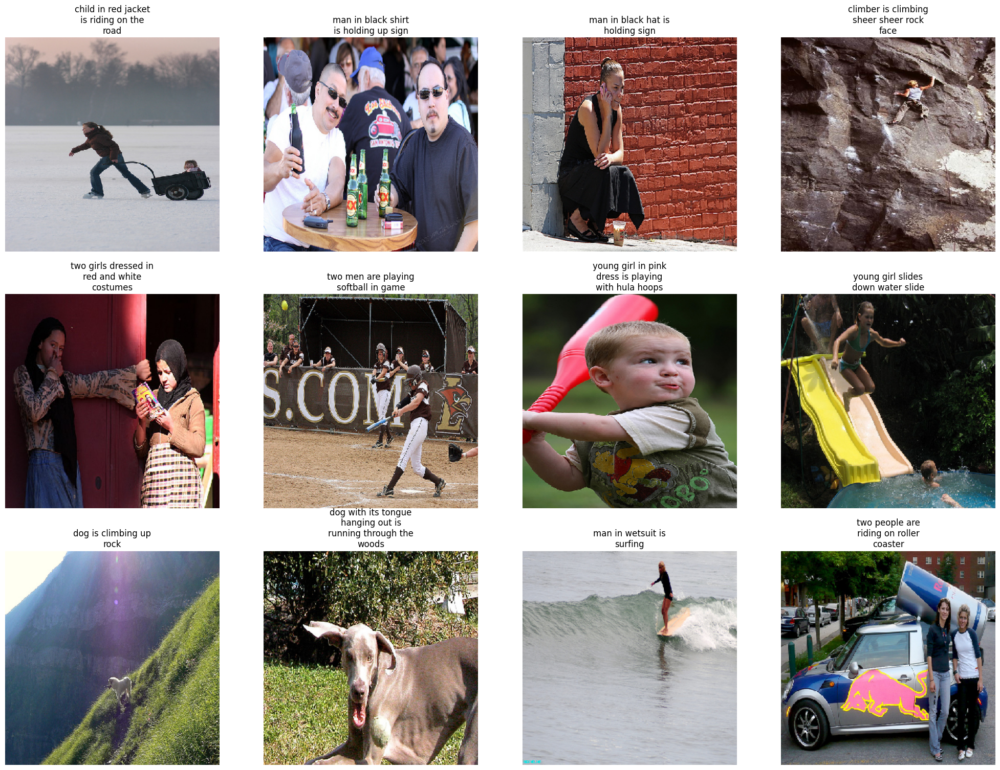

In [48]:
display_imgs(samples)

In [49]:
model.save('last_model.h5')

In [50]:
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ image_features      │ (None, 2048)      │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ caption_input       │ (None, 33)        │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 256)       │    524,544 │ image_features[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding           │ (None, 33, 256)   │  2,172,160 │ caption_input[0]… │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector       │ (None, 33, 256)   │          0 │ dense[0][0]       │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_2       │ (None, 33, 512)   │          0 │ embedding[0][0],  │
│ (Concatenate)       │                   │            │ repeat_vector[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm (LSTM)         │ (None, 33, 512)   │  2,099,200 │ concatenate_2[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed    │ (None, 33, 8485)  │  4,352,805 │ lstm[0][0]        │
│ (TimeDistributed)   │                   │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 27,446,129 (104.70 MB)

 Trainable params: 9,148,709 (34.90 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 18,297,420 (69.80 MB)